## Crimes in Berlin

### Questions

- What part of Berlin is the most dangerous?
- What crimes are growing?
- What crimes are going low?
- Folium based heatmap.

#### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#### Load Data

In [2]:
df = pd.read_csv('data/berlin_crimes.csv')

#### Read Data

In [3]:
df.head()

,Year,District,Code,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local
0,2012,Mitte,10111,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,2012,Mitte,10112,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,2012,Mitte,10113,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,2012,Mitte,10114,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,2012,Mitte,10221,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403


In [4]:
df.tail()

,Year,District,Code,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local
1195,2019,Reinickendorf,123012,Nord 2 - Waidmannslust/Wittenau/Lübars,34,19,372,85,123,1160,30,135,150,93,16,3,306,74,110,728
1196,2019,Reinickendorf,123021,MV 1 - Märkisches Viertel,42,22,491,123,187,1100,51,224,76,40,39,19,286,11,73,986
1197,2019,Reinickendorf,123022,MV 2 - Rollbergsiedlung,6,4,84,19,34,293,13,36,18,34,5,2,156,56,21,212
1198,2019,Reinickendorf,123043,West 3 - Borsigwalde/Freie Scholle,8,4,95,18,43,492,21,96,69,38,6,1,79,8,31,218
1199,2019,Reinickendorf,129900,"Bezirk (Rd), nicht zuzuordnen",3,2,14,7,4,59,0,7,15,0,1,0,7,3,9,21


In [5]:
df.iloc[0]

Year                        2012
District                   Mitte
Code                       10111
Location          Tiergarten Süd
Robbery                       70
Street_robbery                46
Injury                       586
Agg_assault                  194
Threat                       118
Theft                       2263
Car                           18
From_car                     328
Bike                         120
Burglary                      68
Fire                          16
Arson                          4
Damage                       273
Graffiti                      26
Drugs                        171
Local                       1032
Name: 0, dtype: object

In [6]:
df['Location'].unique()[:10]

array(['Tiergarten Süd', 'Regierungsviertel', 'Alexanderplatz',
       'Brunnenstraße Süd', 'Moabit West', 'Moabit Ost', 'Osloer Straße',
       'Brunnenstraße Nord', 'Parkviertel', 'Wedding Zentrum'],
      dtype=object)

In [7]:
# Checking Alexanderplatz, one of the most popular locations in Berlin
df[df['Location'] == 'Alexanderplatz']

,Year,District,Code,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local
2,2012,Mitte,10113,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
152,2013,Mitte,10113,Alexanderplatz,237,149,1442,354,333,10165,85,760,926,281,47,20,1301,448,590,3029
302,2014,Mitte,10113,Alexanderplatz,203,106,1309,364,350,10510,89,710,1074,241,46,18,1207,351,506,2984
452,2015,Mitte,10113,Alexanderplatz,157,90,1440,408,320,12150,83,820,1082,236,35,12,1171,333,499,2973
602,2016,Mitte,10113,Alexanderplatz,165,102,1338,368,313,12479,80,779,1266,222,47,20,1065,328,534,2825
752,2017,Mitte,10113,Alexanderplatz,143,90,1763,478,317,10596,87,705,929,148,45,16,1162,351,804,3227
902,2018,Mitte,10113,Alexanderplatz,130,80,1531,366,309,10144,68,580,880,133,26,6,1036,333,971,2798
1052,2019,Mitte,10113,Alexanderplatz,173,102,1966,500,420,11233,63,587,940,137,43,12,1307,381,1133,3813


Observation:
- A lot is happening in Alexanderplatz which is not surprising because it is one of the most popular and busiest places in Berlin.
- I am curious to know if there are en equal number of locations

In [8]:
df['Location'].value_counts()[:10] # There are equal number of locations

Location
Tiergarten Süd                       8
Plänterwald                          8
Johannisthal                         8
Oberschöneweide                      8
Niederschöneweide                    8
Adlershof                            8
Köllnische Vorstadt/Spindlersfeld    8
Altglienicke                         8
Bohnsdorf                            8
Grünau                               8
Name: count, dtype: int64

In [9]:
# Are there equal number of locations for each district
df.groupby('District')['Location'].value_counts()[:10]

District                    Location                        
Charlottenburg-Wilmersdorf  Barstraße                           8
                            Bezirk (Ch-Wi), nicht zuzuordnen    8
                            Charlottenburg-Nord                 8
                            Düsseldorfer Straße                 8
                            Forst Grunewald                     8
                            Grunewald                           8
                            Halensee                            8
                            Heerstrasse                         8
                            Kantstraße                          8
                            Kurfürstendamm                      8
Name: count, dtype: int64

For each District, each location appears 8 times

In [10]:
# Checking the District in Alexanderplatz (Mitte)
# I would like to know if, in each year, the same locations are considered for each district.
df[df['District'] == 'Mitte'].head()

,Year,District,Code,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local
0,2012,Mitte,10111,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,2012,Mitte,10112,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,2012,Mitte,10113,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,2012,Mitte,10114,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,2012,Mitte,10221,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403


In [11]:
# Just checking if the districts are uniform
df['District'].value_counts()

District
Treptow-Köpenick              168
Charlottenburg-Wilmersdorf    144
Pankow                        136
Lichtenberg                   112
Reinickendorf                  96
Mitte                          88
Neukölln                       88
Spandau                        80
Marzahn-Hellersdorf            80
Friedrichshain-Kreuzberg       72
Steglitz-Zehlendorf            72
Tempelhof-Schöneberg           64
Name: count, dtype: int64

<h3>Observation</h3>
<ul>
    <li>The number of crimes (robbery, street robbery. aggravated assault, theft, etc.) are recorded in each location yearly from 2012 to 2019.</li>
<li>Each location belongs to a particular district with a unique code.</li>
<li>Each district has many locations with a range of codes.</li>
</ul>
<h4>Question</h4>
<ul>
<li>Are the same locations considered every year?</li>
</ul>

In [12]:
df[(df['District'] == 'Neukölln')].groupby('Year')[['District', 'Location']].value_counts()[:10]

Year  District  Location                     
2012  Neukölln  Bezirk (Nk), nicht zuzuordnen    1
                Britz                            1
                Buckow                           1
                Buckow Nord                      1
                Gropiusstadt                     1
                Köllnische Heide                 1
                Neuköllner Mitte/Zentrum         1
                Reuterstraße                     1
                Rixdorf                          1
                Rudow                            1
Name: count, dtype: int64

In [13]:
df.groupby('Year')[['District', 'Location']].value_counts()[:10]

Year  District                    Location                        
2012  Charlottenburg-Wilmersdorf  Barstraße                           1
                                  Bezirk (Ch-Wi), nicht zuzuordnen    1
                                  Charlottenburg-Nord                 1
                                  Düsseldorfer Straße                 1
                                  Forst Grunewald                     1
                                  Grunewald                           1
                                  Halensee                            1
                                  Heerstrasse                         1
                                  Kantstraße                          1
                                  Kurfürstendamm                      1
Name: count, dtype: int64

Observation
- Every year, the same sets of locations are considered for each district.
- The number of locations in each district varies. For example, Mitte has 11 locations, while Treptow-Köpenick has 21 locations.

In [14]:
df.groupby('Year')['District'].value_counts()

Year  District                  
2012  Treptow-Köpenick              21
      Charlottenburg-Wilmersdorf    18
      Pankow                        17
      Lichtenberg                   14
      Reinickendorf                 12
      Mitte                         11
      Neukölln                      11
      Marzahn-Hellersdorf           10
      Spandau                       10
      Friedrichshain-Kreuzberg       9
      Steglitz-Zehlendorf            9
      Tempelhof-Schöneberg           8
2013  Treptow-Köpenick              21
      Charlottenburg-Wilmersdorf    18
      Pankow                        17
      Lichtenberg                   14
      Reinickendorf                 12
      Mitte                         11
      Neukölln                      11
      Marzahn-Hellersdorf           10
      Spandau                       10
      Friedrichshain-Kreuzberg       9
      Steglitz-Zehlendorf            9
      Tempelhof-Schöneberg           8
2014  Treptow-Köpenick         

#### Shape of the Dataset

In [15]:
df.shape

(1200, 20)

There are 1200 rows and 20 columns (features). How many features are objects and how many are numerical?

In [16]:
object_columns = df.select_dtypes(include='object').columns
object_columns

Index(['District', 'Location'], dtype='object')

In [17]:
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
numerical_columns

Index(['Year', 'Code', 'Robbery', 'Street_robbery', 'Injury', 'Agg_assault',
       'Threat', 'Theft', 'Car', 'From_car', 'Bike', 'Burglary', 'Fire',
       'Arson', 'Damage', 'Graffiti', 'Drugs', 'Local'],
      dtype='object')

In [18]:
print(len(object_columns))
print(len(numerical_columns))

2
18


There are 2 object columns and 18 numerical columns. It will be beneficial to verify that

#### Data Type

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Year            1200 non-null   int64 
 1   District        1200 non-null   object
 2   Code            1200 non-null   int64 
 3   Location        1200 non-null   object
 4   Robbery         1200 non-null   int64 
 5   Street_robbery  1200 non-null   int64 
 6   Injury          1200 non-null   int64 
 7   Agg_assault     1200 non-null   int64 
 8   Threat          1200 non-null   int64 
 9   Theft           1200 non-null   int64 
 10  Car             1200 non-null   int64 
 11  From_car        1200 non-null   int64 
 12  Bike            1200 non-null   int64 
 13  Burglary        1200 non-null   int64 
 14  Fire            1200 non-null   int64 
 15  Arson           1200 non-null   int64 
 16  Damage          1200 non-null   int64 
 17  Graffiti        1200 non-null   int64 
 18  Drugs   

In [20]:
df.dtypes

Year               int64
District          object
Code               int64
Location          object
Robbery            int64
Street_robbery     int64
Injury             int64
Agg_assault        int64
Threat             int64
Theft              int64
Car                int64
From_car           int64
Bike               int64
Burglary           int64
Fire               int64
Arson              int64
Damage             int64
Graffiti           int64
Drugs              int64
Local              int64
dtype: object

### Data Cleaning

#### Rename Columns (Lowercase)

I prefer to have my column names in lowercase

In [21]:
def lower_column_names(col):
    return col.lower()

# df.columns.map(lambda col: col.lower())

In [22]:
df.columns = df.columns.map(lower_column_names)
df.columns

Index(['year', 'district', 'code', 'location', 'robbery', 'street_robbery',
       'injury', 'agg_assault', 'threat', 'theft', 'car', 'from_car', 'bike',
       'burglary', 'fire', 'arson', 'damage', 'graffiti', 'drugs', 'local'],
      dtype='object')

In [23]:
df.head()

,year,district,code,location,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local
0,2012,Mitte,10111,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,2012,Mitte,10112,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,2012,Mitte,10113,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,2012,Mitte,10114,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,2012,Mitte,10221,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403


#### Check for null values

In [24]:
df.isnull().sum()

year              0
district          0
code              0
location          0
robbery           0
street_robbery    0
injury            0
agg_assault       0
threat            0
theft             0
car               0
from_car          0
bike              0
burglary          0
fire              0
arson             0
damage            0
graffiti          0
drugs             0
local             0
dtype: int64

In [25]:
df.isna().sum()

year              0
district          0
code              0
location          0
robbery           0
street_robbery    0
injury            0
agg_assault       0
threat            0
theft             0
car               0
from_car          0
bike              0
burglary          0
fire              0
arson             0
damage            0
graffiti          0
drugs             0
local             0
dtype: int64

#### Check for duplicated values

In [26]:
sum(df.duplicated())

0

I think a better representation of the district column should be categorical

In [27]:
df['district'].unique()

array(['Mitte', 'Friedrichshain-Kreuzberg', 'Pankow',
       'Charlottenburg-Wilmersdorf', 'Spandau', 'Steglitz-Zehlendorf',
       'Tempelhof-Schöneberg', 'Neukölln', 'Treptow-Köpenick',
       'Marzahn-Hellersdorf', 'Lichtenberg', 'Reinickendorf'],
      dtype=object)

In [28]:
df['district'] = df['district'].astype('category')

In [29]:
df.dtypes

year                 int64
district          category
code                 int64
location            object
robbery              int64
street_robbery       int64
injury               int64
agg_assault          int64
threat               int64
theft                int64
car                  int64
from_car             int64
bike                 int64
burglary             int64
fire                 int64
arson                int64
damage               int64
graffiti             int64
drugs                int64
local                int64
dtype: object

In [30]:
df.district.cat.categories

Index(['Charlottenburg-Wilmersdorf', 'Friedrichshain-Kreuzberg', 'Lichtenberg',
       'Marzahn-Hellersdorf', 'Mitte', 'Neukölln', 'Pankow', 'Reinickendorf',
       'Spandau', 'Steglitz-Zehlendorf', 'Tempelhof-Schöneberg',
       'Treptow-Köpenick'],
      dtype='object')

### Data Refactoring

I would like to find the total crimes for each location

In [31]:
crime_cols = df.copy().loc[:, ~df.columns.isin(['code', 'year', 'district', 'location'])]
df['total_crime_count'] = crime_cols.sum(axis=1)

In [32]:
df.head()

,year,district,code,location,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local,total_crime_count
0,2012,Mitte,10111,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032,5333
1,2012,Mitte,10112,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870,6046
2,2012,Mitte,10113,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108,19314
3,2012,Mitte,10114,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752,4712
4,2012,Mitte,10221,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403,6960


I want to get the average of a the crimes row-wise but I notice that there's disparity in the data which may indicate that the median will be the best measure of getting the average because of it's resistance to outliers.

In [33]:
df['median_crime_count'] = crime_cols.median(axis=1)

In [34]:
df.head()

,year,district,code,location,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local,total_crime_count,median_crime_count
0,2012,Mitte,10111,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032,5333,119.0
1,2012,Mitte,10112,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870,6046,123.5
2,2012,Mitte,10113,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108,19314,444.5
3,2012,Mitte,10114,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752,4712,126.5
4,2012,Mitte,10221,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403,6960,192.0


In [35]:
df.tail()

,year,district,code,location,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local,total_crime_count,median_crime_count
1195,2019,Reinickendorf,123012,Nord 2 - Waidmannslust/Wittenau/Lübars,34,19,372,85,123,1160,30,135,150,93,16,3,306,74,110,728,3438,101.5
1196,2019,Reinickendorf,123021,MV 1 - Märkisches Viertel,42,22,491,123,187,1100,51,224,76,40,39,19,286,11,73,986,3770,74.5
1197,2019,Reinickendorf,123022,MV 2 - Rollbergsiedlung,6,4,84,19,34,293,13,36,18,34,5,2,156,56,21,212,993,27.5
1198,2019,Reinickendorf,123043,West 3 - Borsigwalde/Freie Scholle,8,4,95,18,43,492,21,96,69,38,6,1,79,8,31,218,1227,34.5
1199,2019,Reinickendorf,129900,"Bezirk (Rd), nicht zuzuordnen",3,2,14,7,4,59,0,7,15,0,1,0,7,3,9,21,152,5.5


In [36]:
df.isnull().sum()

year                  0
district              0
code                  0
location              0
robbery               0
street_robbery        0
injury                0
agg_assault           0
threat                0
theft                 0
car                   0
from_car              0
bike                  0
burglary              0
fire                  0
arson                 0
damage                0
graffiti              0
drugs                 0
local                 0
total_crime_count     0
median_crime_count    0
dtype: int64

### Exploratory Data Analysis

In [37]:
summary = df.copy().describe().T
Q3 = summary['75%']
Q1 = summary['25%']
summary['iqr'] =  Q3 - Q1
summary

,count,mean,std,min,25%,50%,75%,max,iqr
year,1200.0,2015.500000,2.292243,2012.0,2013.75,2015.5,2017.25,2019.0,3.5
code,1200.0,67022.786667,34813.745984,10111.0,40101.00,70151.5,90520.00,129900.0,50419.0
robbery,1200.0,34.233333,37.093447,0.0,10.00,22.0,42.00,242.0,32.0
street_robbery,1200.0,18.744167,22.171153,0.0,5.00,11.0,23.00,169.0,18.0
injury,1200.0,276.334167,243.697780,0.0,108.00,204.5,361.00,1966.0,253.0
agg_assault,1200.0,68.750000,71.113959,0.0,22.00,44.0,86.00,500.0,64.0
threat,1200.0,92.583333,68.455264,0.0,42.00,75.0,124.00,420.0,82.0
theft,1200.0,1492.307500,1364.442501,17.0,639.75,1100.0,2019.75,12479.0,1380.0
car,1200.0,42.505833,28.710164,0.0,22.00,37.0,57.00,197.0,35.0
from_car,1200.0,215.275000,150.031343,1.0,109.00,186.0,291.00,876.0,182.0


Observation:
- For most of the crime variables, the mean is bigger than the median. The distribution of the data may be right-skewed which shows there are large values at the tail that increase the value of the mean. The median is a better measure of the average because they are less susceptible to outliers.
- For some of the crime features, the IQR value is bigger than the standard deviation.
- There are always theft, local, and from_car crimes.
- There are an incredible amount of thefts.

Question
- What are the biggest contributors to the outliers? Districts? Location? Year?

#### Check Categorical Columns 

In [38]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns
df[cat_cols].describe()

,district,location
count,1200,1200
unique,12,150
top,Treptow-Köpenick,Tiergarten Süd
freq,168,8


There are 12 unique districts. The data shows crime occurring more in Treptow-Köpenick which occurs 168 times (about 1.8 times the other districts). There are also 150 unique locations with Tiergarten Süd as the most frequently occurring (8 times).

In [39]:
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', 
          '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52',
          '#3BB9FF', '#222222', 'lightslategray', '#F08080', '#CCCCFF', '#800080']

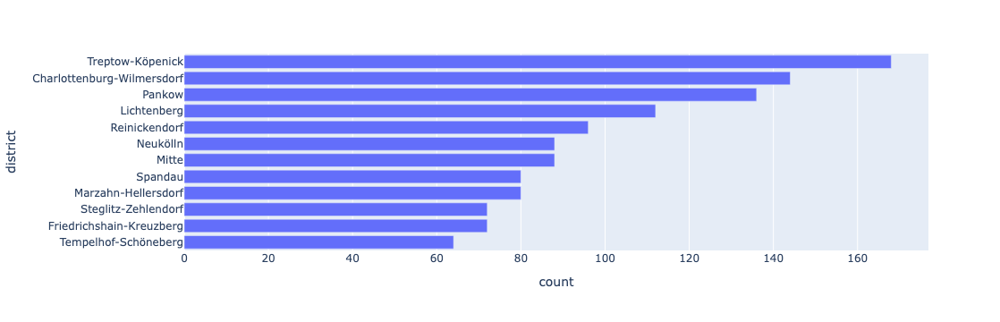

In [40]:
# Most frequently occurring districts
district_count = df['district'].value_counts().sort_values(ascending=True)
fig = px.bar(district_count, x='count', hover_data=['count'], orientation='h', color_discrete_sequence=colors)
fig.update_layout(autosize=True, height=400)
fig.show()

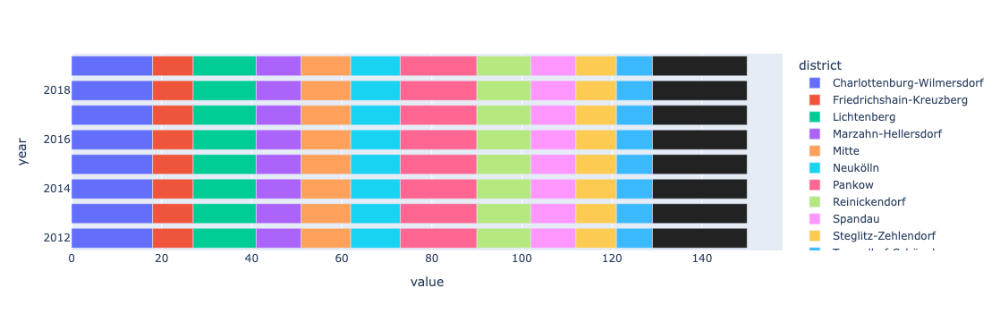

In [41]:
yearly_district_count = df.groupby('year', observed=False)['district'].value_counts().unstack()
fig = px.bar(yearly_district_count, orientation='h', color_discrete_sequence=colors, height=400)
fig.update_layout(autosize=True)
fig.show()

In [42]:
# Most frequently occurring locations
largest_location_count = df['location'].value_counts().nlargest()
largest_location_count

location
Tiergarten Süd       8
Plänterwald          8
Johannisthal         8
Oberschöneweide      8
Niederschöneweide    8
Name: count, dtype: int64

In [43]:
smallest_location_count = df['location'].value_counts().nsmallest()
smallest_location_count

location
Tiergarten Süd       8
Plänterwald          8
Johannisthal         8
Oberschöneweide      8
Niederschöneweide    8
Name: count, dtype: int64

All the locations have equal frequencies.

#### Distribution of the Crimes

Distribution of the crimes between 2012 and 2019

In [44]:
crime_data = df.copy().select_dtypes('int64').iloc[:, 2:-1]
crime_data.head()

,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local
0,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403


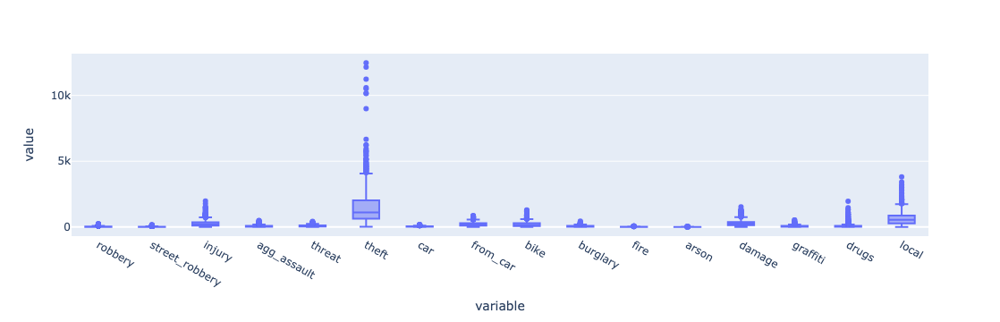

In [45]:
fig = px.box(crime_data)
fig.update_layout(autosize=True, height=600)
fig.show()

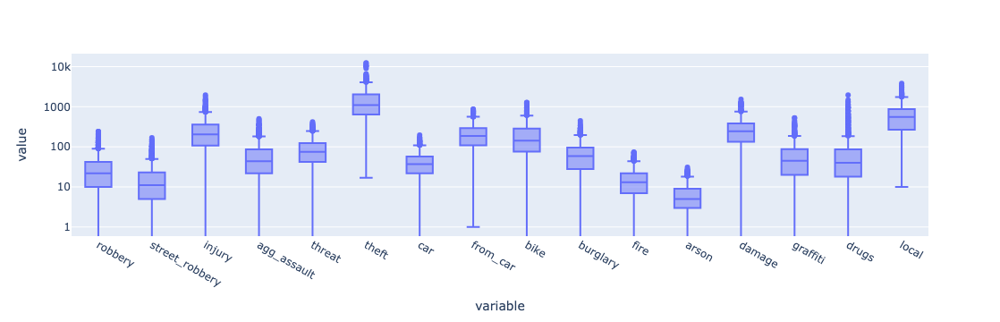

In [46]:
fig = px.box(crime_data, log_y=True)
fig.update_layout(autosize=True, height=600)
fig.show()

Observation

- Theft and local crimes are the most prevalent crimes with outliers in specific locations or years.

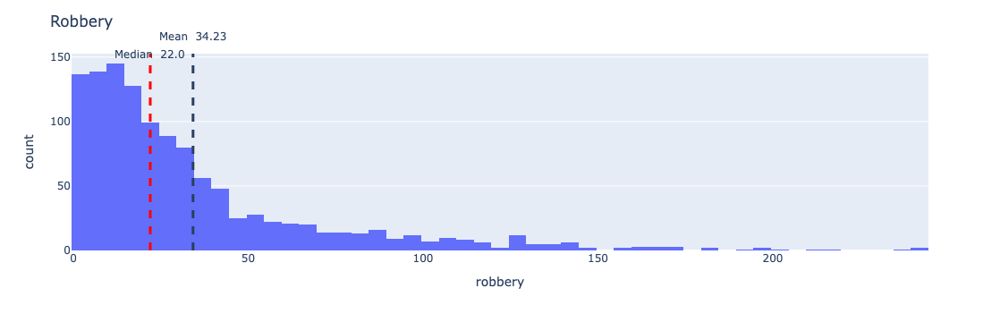

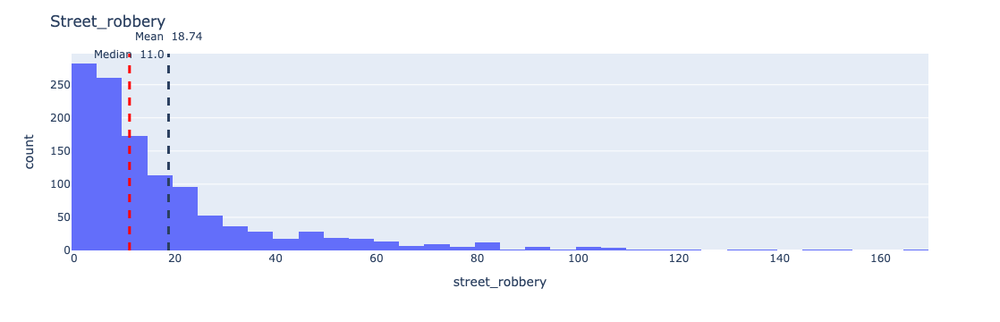

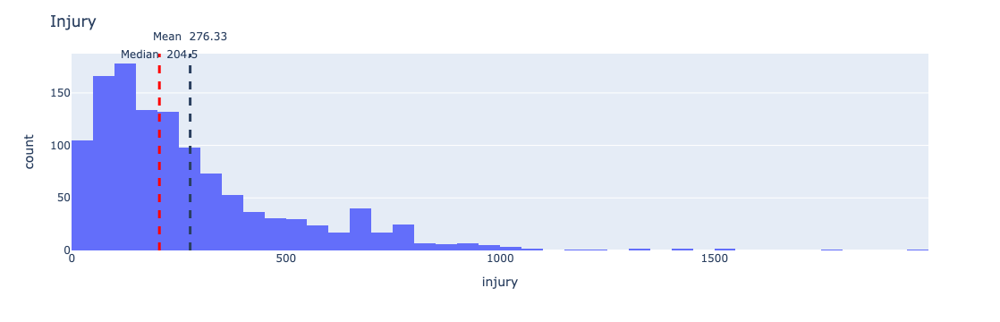

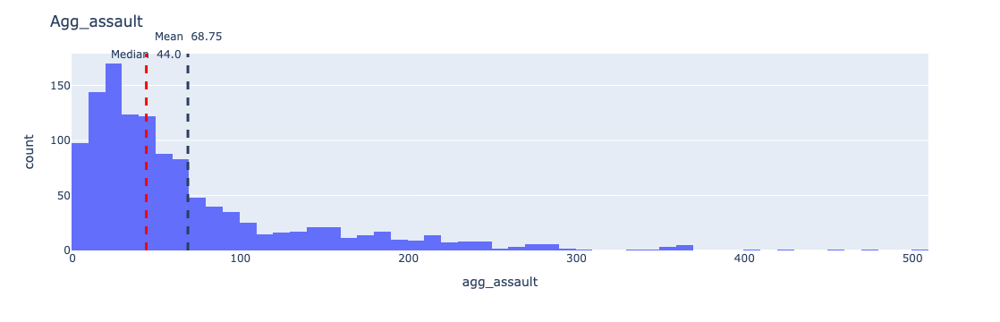

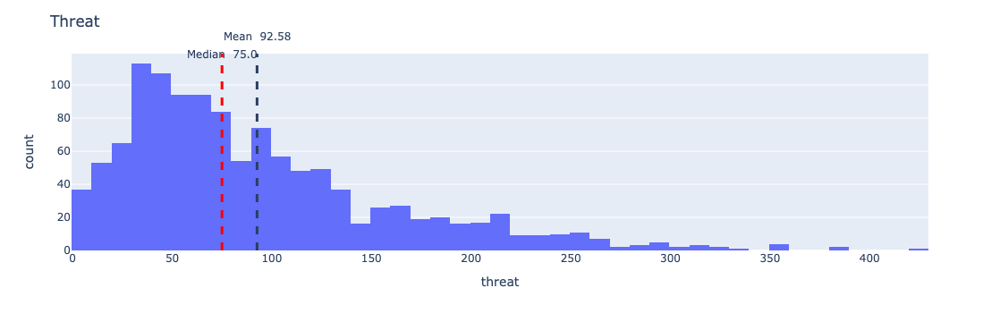

...

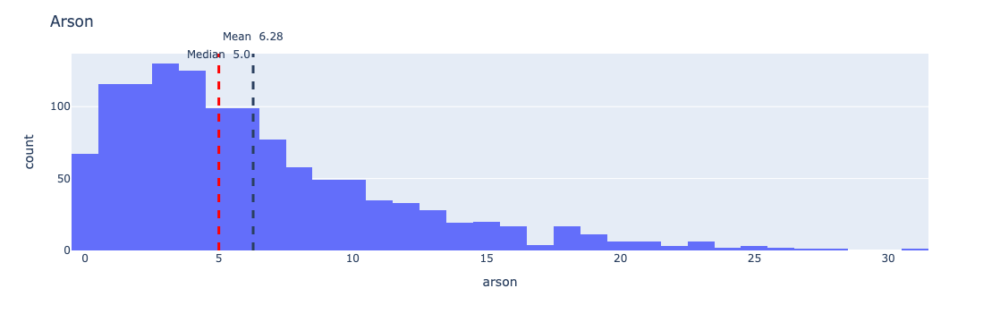

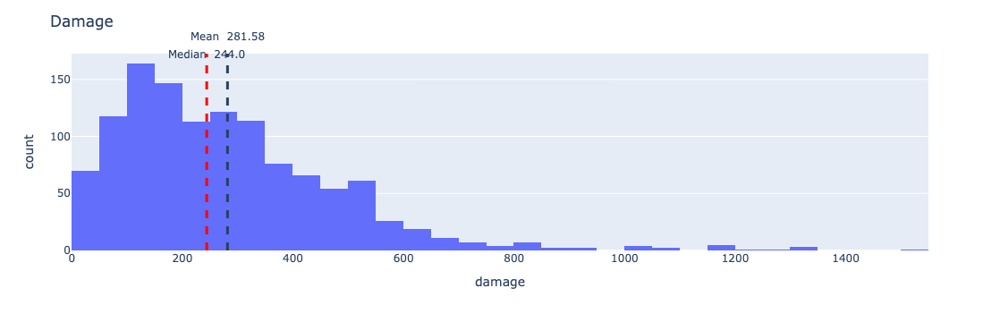

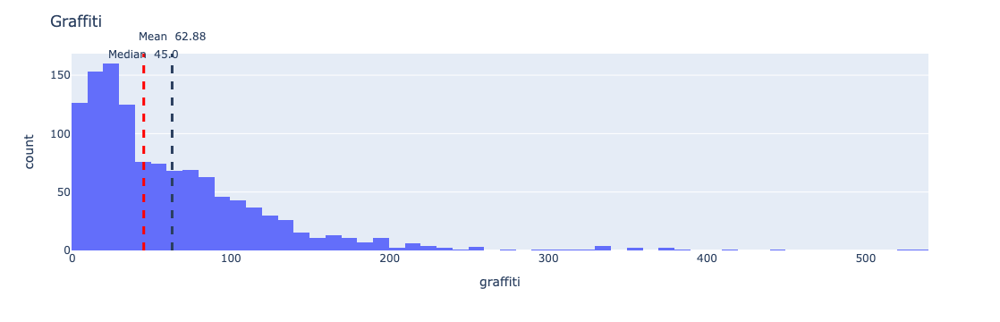

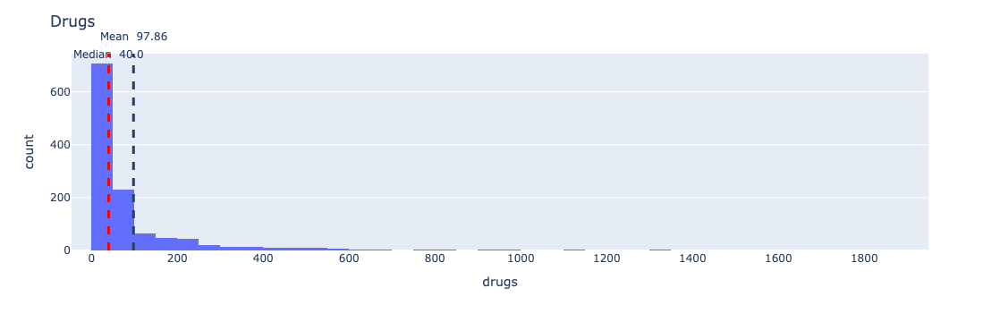

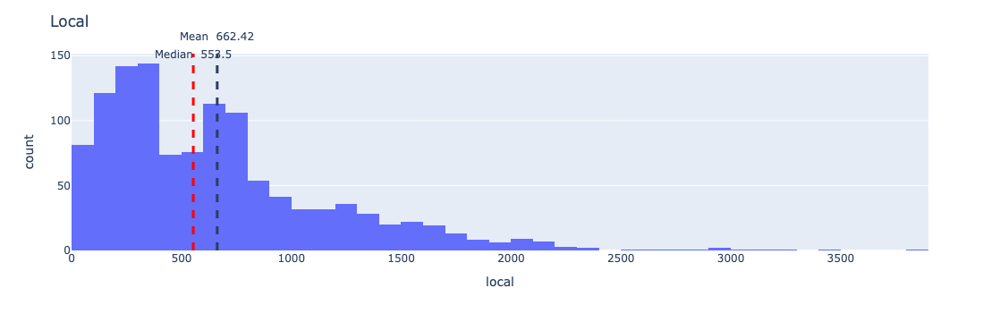

In [75]:
for crime in crime_data.columns:
    fig = px.histogram(crime_data, x=crime)
    fig.update_layout(title=crime.capitalize())
    mean = crime_data[crime].mean()
    median = crime_data[crime].median()
    fig.add_vline(x=mean, line_width=3, line_dash='dash', 
                  annotation=dict(text=f'Mean \n{round(mean, 2)}', yshift=10), 
                  annotation_position="top")
    fig.add_vline(x=median, line_width=3, line_dash='dash', line_color="red", 
                  annotation=dict(text=f'Median \n{round(median, 2)}', yshift=-10), 
                  annotation_position="top")
    fig.show()

Observations:
- The concentration of the data is on the left side of the distribution, which means specific locations had more crimes than the average.
- The median is on the left side of the mean. The median may be a better representation for finding the center of the distribution.
- Local crime is right-skewed but has a double-peak.

robbery           0.009418
street_robbery    0.005157
injury            0.076022
agg_assault       0.018914
threat            0.025470
theft             0.410545
car               0.011694
from_car          0.059224
bike              0.054391
burglary          0.019117
fire              0.004399
arson             0.001728
damage            0.077465
graffiti          0.017300
drugs             0.026922
local             0.182236
dtype: float64


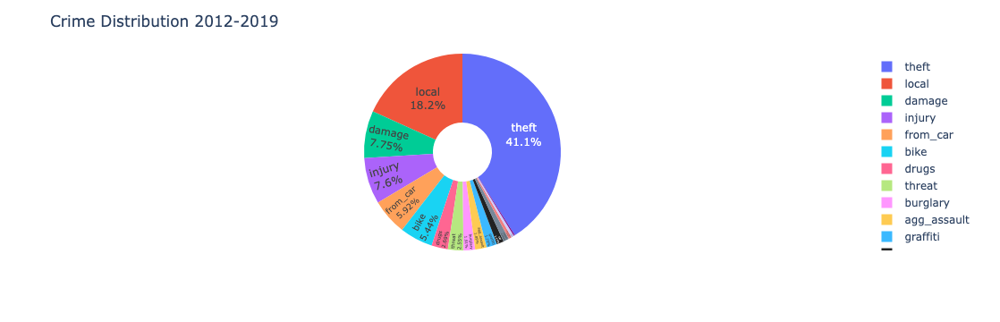

In [67]:
perc_crime_distribution = crime_data.sum(axis=0) / crime_data.sum().sum()
print(perc_crime_distribution)
fig = px.pie(crime_data, values=perc_crime_distribution, names=crime_data.columns, hole=.3, color_discrete_sequence=colors)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text='Crime Distribution 2012-2019', height=600, autosize=True)
fig.show()

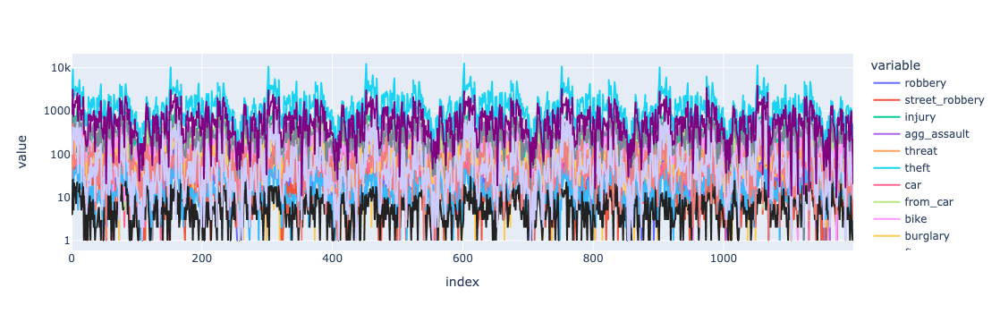

In [68]:
fig = px.line(crime_data, log_y=True, color_discrete_sequence=colors)
fig.update_layout(height=600, autosize=True)
fig.show()

#### Yearly Total Crime Count between 2012 - 2019

In [69]:
total_yearly_crimes = df.copy().groupby('year')[crime_data.columns].sum()
total_yearly_crimes

,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local
year,,,,,,,,,,,,,,,,
2012,6283,2886,42153,11032,14196,207340,5732,30503,25836,12285,2514,904,48582,11070,11687,101472
2013,6088,3135,41461,10247,14333,220417,6628,35652,26389,11563,2561,972,43176,9573,12746,101063
2014,5583,3228,39190,9515,13733,229955,6629,36032,30434,12149,2322,908,40678,8166,12878,97700
2015,5318,2914,39312,9664,13260,251366,6649,34741,31937,11805,2103,834,39841,8471,15176,100220
2016,5046,2962,41339,10024,13557,251192,7305,34515,34136,11487,2529,1032,41768,9015,14407,100073
2017,4165,2324,42283,10608,13452,220220,6642,32308,30082,8572,2210,872,40985,10428,15503,95027
2018,4202,2417,42828,10656,13965,209957,5671,28677,29978,7568,2334,886,39883,9103,16700,97763
2019,4395,2627,43035,10754,14604,200322,5751,25902,28456,7958,2616,1130,42986,9635,18334,101581


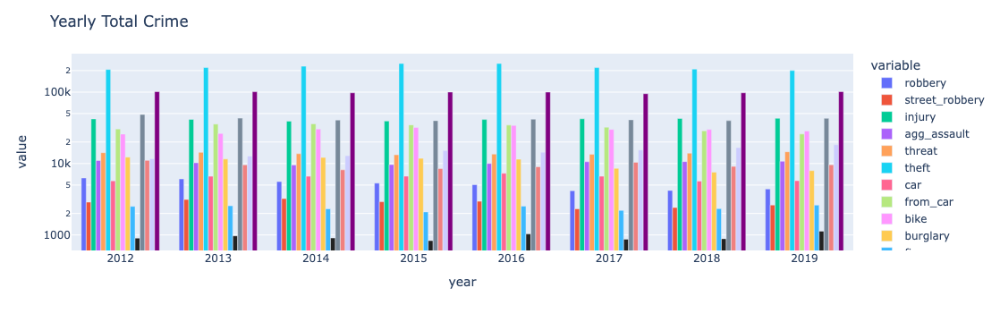

In [70]:
fig = px.bar(total_yearly_crimes, barmode='group', log_y=True, color_discrete_sequence=colors)
fig.update_layout(title_text='Yearly Total Crime', height=600, autosize=True)
fig.show()

#### Yearly Total Crime Counts

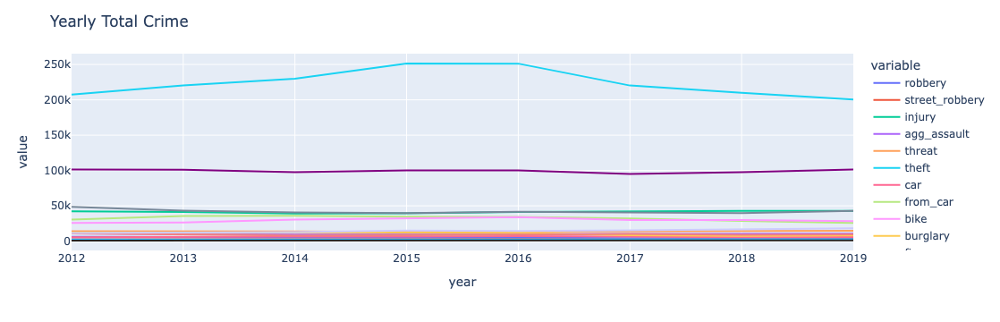

In [71]:
fig = px.line(total_yearly_crimes, color_discrete_sequence=colors)
fig.update_layout(title_text='Yearly Total Crime', height=600)
fig.show()

The theft and local makes the other variables less visible

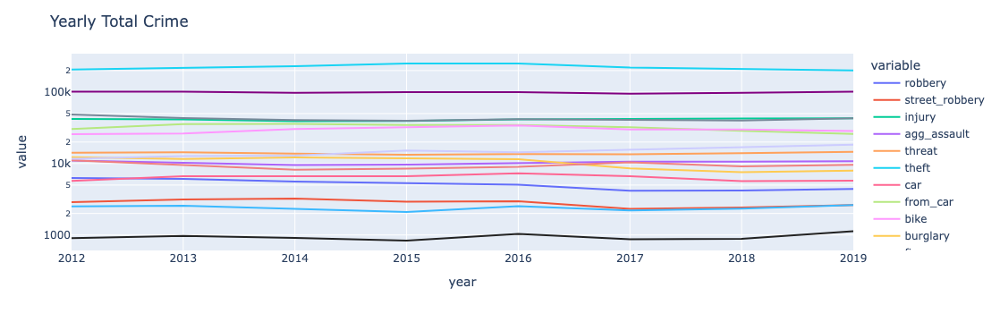

In [72]:
fig = px.line(total_yearly_crimes, log_y=True, color_discrete_sequence=colors)
fig.update_layout(title_text='Yearly Total Crime', height=600, autosize=True)
fig.show()

Much better but this looks like a wave. I cannot see the trend.

#### Feature Normalization

In [73]:
data_feature_norm = (total_yearly_crimes - total_yearly_crimes.mean()) / total_yearly_crimes.std()
data_feature_norm.head()

,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local
year,,,,,,,,,,,,,,,,
2012,1.382428,0.228110,0.475575,1.325671,0.659970,-0.858758,-1.090972,-0.489774,-1.389984,0.923565,0.627096,-0.392014,2.219474,1.693391,-1.350105,0.909978
2013,1.147608,0.991797,0.007358,-0.120683,0.953052,-0.178406,0.427197,0.920457,-1.188764,0.565376,0.882555,0.304900,0.328349,0.145177,-0.872223,0.733558
2014,0.539484,1.277030,-1.529233,-1.469386,-0.330520,0.317824,0.428891,1.024533,0.283091,0.856094,-0.416479,-0.351019,-0.545500,-1.309957,-0.812657,-0.717059
2015,0.220370,0.313986,-1.446686,-1.194855,-1.342402,1.431766,0.462779,0.670948,0.829988,0.685433,-1.606807,-1.109425,-0.838299,-0.994523,0.224331,0.369933
2016,-0.107174,0.461203,-0.075189,-0.531558,-0.707034,1.422713,1.574296,0.609050,1.630138,0.527672,0.708626,0.919824,-0.164197,-0.431912,-0.122685,0.306525


In [82]:
data_feature_norm.describe()

,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local
count,8.000000e+00,8.000000,8.000000,8.000000e+00,8.000000e+00,8.000000,8.000000e+00,8.000000,8.000000e+00,8.000000,8.000000,8.000000e+00,8.000000,8.000000e+00,8.000000e+00,8.000000e+00
mean,-5.551115e-17,0.000000,0.000000,2.775558e-17,-2.775558e-17,0.000000,4.163336e-17,0.000000,-5.551115e-17,0.000000,0.000000,2.775558e-17,0.000000,-2.081668e-17,5.551115e-17,-2.775558e-17
std,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.168079e+00,-1.495555,-1.529233,-1.469386e+00,-1.342402e+00,-1.223880,-1.194330e+00,-1.749915,-1.389984e+00,-1.416571,-1.606807,-1.109425e+00,-0.838299,-1.309957e+00,-1.350105e+00,-1.870046e+00
25%,-9.492151e-01,-0.727267,-0.418063,-6.973824e-01,-7.631903e-01,-0.756642,-1.066827e+00,-0.614802,-6.246741e-01,-0.994632,-0.568667,-6.123617e-01,-0.615027,-5.725649e-01,-8.275489e-01,-6.966776e-01
50%,5.659766e-02,0.271048,0.241467,2.118863e-01,-8.236252e-02,-0.183530,4.280441e-01,0.306819,1.360874e-01,0.546524,0.137920,-3.715165e-01,-0.301151,-9.786218e-02,5.082282e-02,3.382291e-01
75%,6.915151e-01,0.593852,0.655724,6.780363e-01,7.332403e-01,0.594046,4.538834e-01,0.733325,4.198152e-01,0.728099,0.752108,4.586307e-01,0.278500,4.143306e-01,5.069308e-01,7.776627e-01
max,1.382428e+00,1.277030,1.072349,1.325671e+00,1.532799e+00,1.431766,1.574296e+00,1.024533,1.630138e+00,0.923565,1.181496,1.924199e+00,2.219474,1.693391e+00,1.649401e+00,9.569948e-01


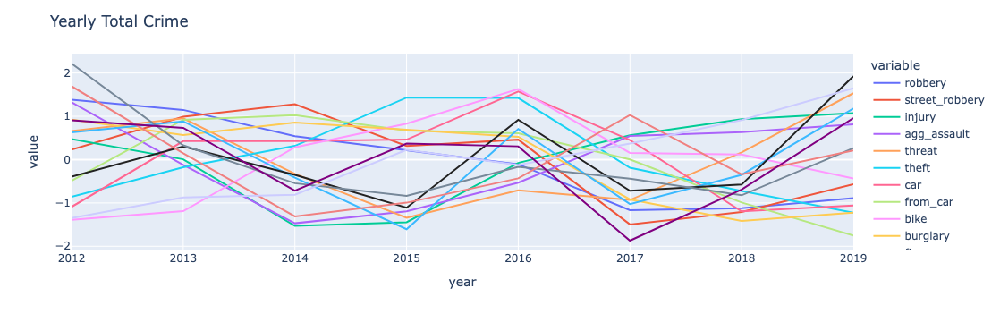

In [83]:
fig = px.line(data_feature_norm, color_discrete_sequence=colors)
fig.update_layout(title_text='Yearly Total Crime', height=600, autosize=True)
fig.show()

Observation
- The graph looks like a zigzag. There are variations in the data over time.
- Some crimes have a sharp increase or decrease in certain years while others go in the opposite direction. For example, In 2017, all other crimes seem to have dropped except graffiti and aggravated assault.
- What could have happened to cause the sharp decrease in crimes in 2017?
- The increase in crimes from 2015 to 2016?

#### Median-Average Yearly Crime

In [55]:
median_yearly_crimes = df.copy().groupby('year')[crime_data.columns].median()
median_yearly_crimes

,robbery,street_robbery,injury,agg_assault,threat,theft,car,from_car,bike,burglary,fire,arson,damage,graffiti,drugs,local
year,,,,,,,,,,,,,,,,
2012,26.0,10.5,213.0,49.5,76.0,1113.5,34.0,187.0,131.0,67.0,11.5,4.0,282.0,62.0,33.5,600.5
2013,25.5,11.5,205.0,44.0,74.5,1175.0,37.5,209.0,143.5,63.0,14.0,5.0,235.0,46.0,33.0,588.5
2014,25.0,13.5,168.0,38.5,74.0,1166.5,39.5,211.5,149.5,67.0,11.0,5.0,223.0,38.0,40.0,547.5
2015,22.0,11.0,188.5,40.0,66.0,1191.5,39.5,200.0,144.5,67.0,11.0,4.0,221.5,39.0,37.0,544.0
2016,22.0,11.0,205.5,43.0,76.5,1202.5,41.0,195.5,160.5,68.0,14.0,5.0,231.0,35.5,38.5,560.0
2017,19.5,10.0,202.5,46.5,69.0,1052.5,39.0,179.5,136.0,54.5,11.0,5.0,241.5,52.0,40.0,534.0
2018,19.0,9.5,208.5,49.0,77.0,1032.0,34.0,152.5,131.0,44.5,14.0,5.0,237.0,42.5,47.5,507.0
2019,19.5,10.0,223.5,49.0,80.0,951.0,37.5,146.0,123.5,45.0,14.0,6.0,252.0,40.0,45.0,573.0


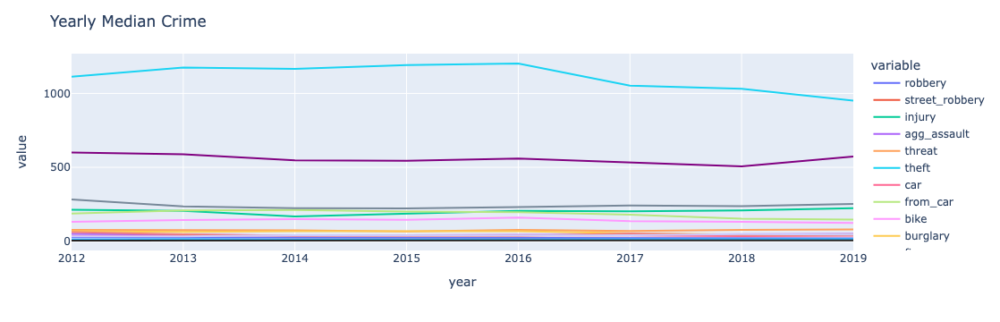

In [70]:
fig = px.line(median_yearly_crimes, color_discrete_sequence=colors)
fig.update_layout(title_text='Yearly Median Crime', height=600, autosize=True)
fig.show()

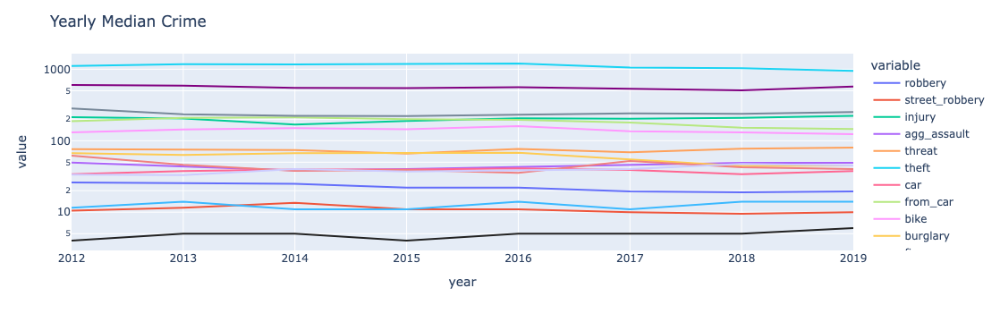

In [71]:
fig = px.line(median_yearly_crimes, color_discrete_sequence=colors, log_y=True)
fig.update_layout(title_text='Yearly Median Crime', height=600, autosize=True)
fig.show()